## Satellite Image Data Analysis Using NumPy

**Loading the Libraries we need: numpy,scipy, matplotlib**

In [10]:
#importing libraries we need
%matplotlib inline
import numpy as np
from scipy import misc
import matplotlib.pyplot as plt
import imageio

#### Creating a numpy array from an image file:

In [2]:
#use imread function to read the image

from skimage import data

photo_data = misc.imread('./asset-v1_UCSanDiegoX+DSE200x+2T2017+type@asset+block@Week-3-Numpy/wifire/sd-3layers.jpg')

type(photo_data)

/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  """


numpy.ndarray

In [13]:
#use imread function to read the image

from skimage import data

photo_data = imageio.imread('./downloaded/wifire/sd-3layers.jpg')

type(photo_data)

imageio.core.util.Array

*Let's see what is in this image*

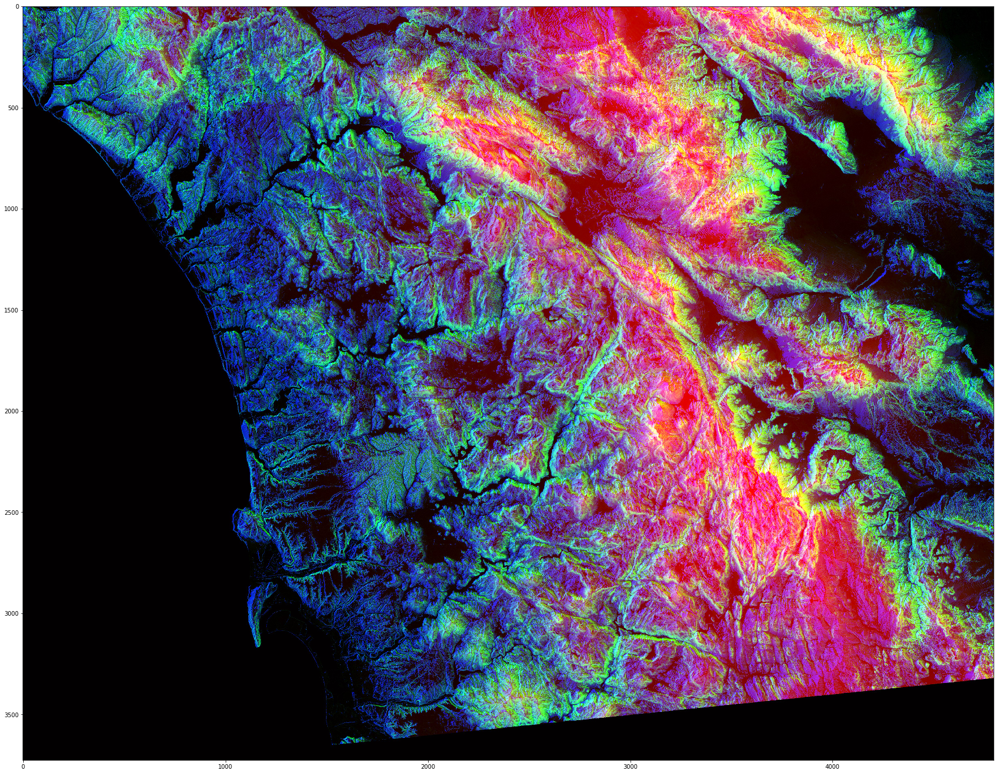

In [14]:
#plot the image in our notebook with 30x30 resolution
#you can also change the resolution if you want
plt.figure(figsize=(30,30))  
#we'll use imshow function ski image to display it.
plt.imshow(photo_data)

In [15]:
photo_data.shape
#print photo data shape

(3725, 4797, 3)

The shape of the ndarray show that it is a three layerd matrix. The first two number here are length and width, and the third number (i.e. 3) is for three layers: Red, Green and blue.

#### RGB Color Mapping in the Photo:
* <font color=red> RED pixels indicates Altitude </font>
* <font color=blue> BLUE pixels indicates Aspect </font>
* <font color=green> GREEN pixels indicates Slope </font>

The higher values denotes higher altitude, aspect and slope.

In [16]:
#check size
photo_data.size

53606475

In [19]:
#check max and min values in data
#These values are important to verify because color intensity cannot be outside 0 and 255
photo_data.min(), photo_data.max()

(0, 255)

In [20]:
#check mean
photo_data.mean()

75.8299354508947

**Check specific pixel RGB value**

In [21]:
#pixel on the 150th row and 250th Column
photo_data[150,250]

Array([ 17,  35, 255], dtype=uint8)

In [23]:
#index of red is 0, green is 1, blue is 2
#if you want to find green value of particular pixel you simply add index number
photo_data[150,250,1]

35

### Set a Pixel to All Zeros
we can set all three layer in a picel as once by assigning zero globally to that (row, column) pairing. However, setting one pixel to zero is not noticable.

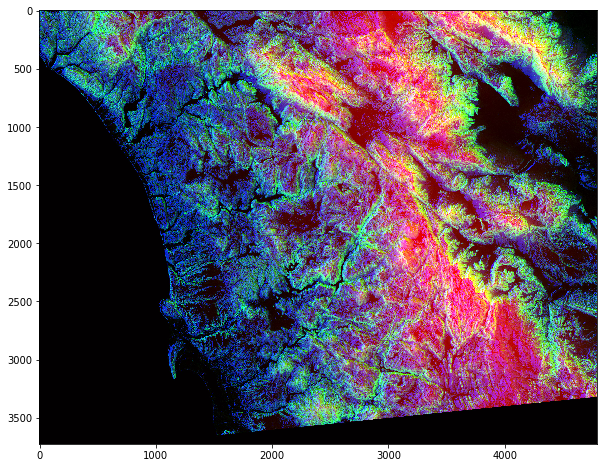

In [24]:
#photo_data = imageio.imread('./downloaded/wifire/sd-3layers.jpg')
photo_data[150,250] = 0   #set all three layers to zero
plt.figure(figsize=(10,10))
plt.imshow(photo_data)

### Changing colors in a Range
We can also use a range to change the pixel values. As an example, let's se the green layer for the rows 200 to 800 to full intensity.

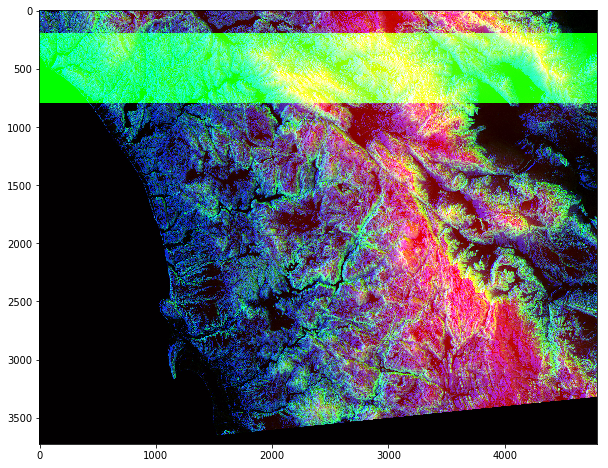

In [25]:
photo_data = imageio.imread('./downloaded/wifire/sd-3layers.jpg')

#this code line selected rows from 200 to 800(800 not included) then selected all the columns and 
#index 1 is green color and 255 is full intensity
photo_data[200:800,:,1] = 255 
plt.figure(figsize=(10,10))
plt.imshow(photo_data)

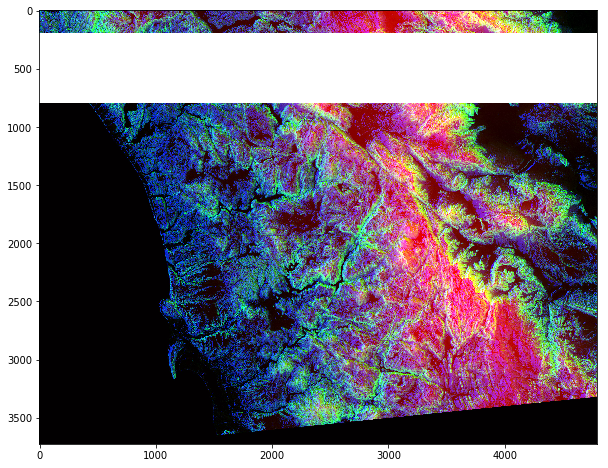

In [27]:
photo_data = imageio.imread('./downloaded/wifire/sd-3layers.jpg')

#this code line selected rows from 200 to 800(800 not included) then selected all the columns 
#no index is selected this time and 255 is full intensity
photo_data[200:800,:] = 255 
plt.figure(figsize=(10,10))
plt.imshow(photo_data)

In above image, when no index is selected, python bydefault selected all the indecies and modified their values to 255, so RGB (255,255,255) is white color. Full intensity of all RGB color adds to make white 

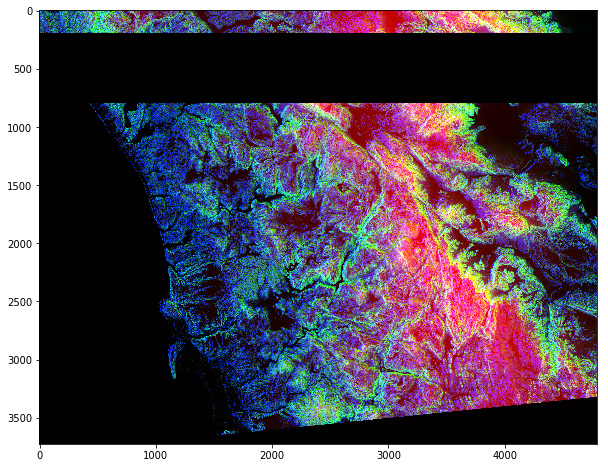

In [28]:
photo_data = imageio.imread('./downloaded/wifire/sd-3layers.jpg')

#this code line selected rows from 200 to 800(800 not included) then selected all the columns 
#no index is selected this time and 0 is no intensity
photo_data[200:800,:] = 0 
plt.figure(figsize=(10,10))
plt.imshow(photo_data)

In above image, when no index is selected, python bydefault selected all the indecies and modified their values to 0, so RGB (0,0,0) is Black color.

### Pick all Pixels with Low Values

In [32]:
photo_data = imageio.imread('./downloaded/wifire/sd-3layers.jpg')
print("Shape of photo_data:", photo_data.shape)
low_value_filter = photo_data < 200
print("Shape of low_value_filter:", low_value_filter.shape)

Shape of photo_data: (3725, 4797, 3)
Shape of low_value_filter: (3725, 4797, 3)


In above shape is same because we just picked low values, the low_value_filte contain boolean for the condition of filter

### Filtering Out Low Values
Whenever the low_value_filter is **True**, set value to 0.

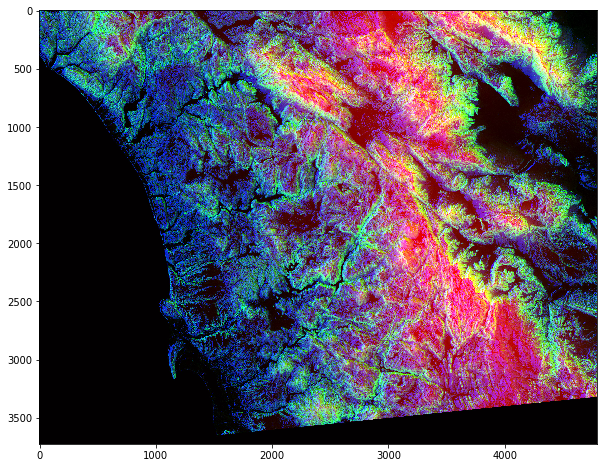

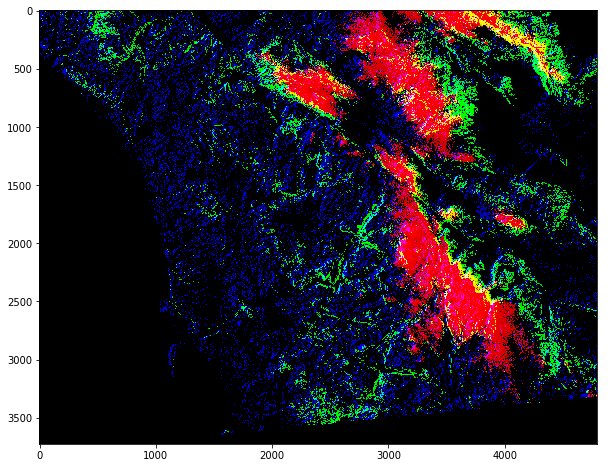

In [33]:
import random
plt.figure(figsize=(10,10))
plt.imshow(photo_data)
photo_data[low_value_filter] = 0  # applying filter to zero
plt.figure(figsize=(10,10))
plt.imshow(photo_data)

### More Row and Column Operations
You can design complex patters by making cols a function of rows or vice-versa. Here we try a linear relationship between rows and columns.

In [35]:
rows_range = np.arange(len(photo_data))
cols_range = rows_range
print(type(rows_range))

<class 'numpy.ndarray'>


In [36]:
photo_data[rows_range, cols_range] = 255

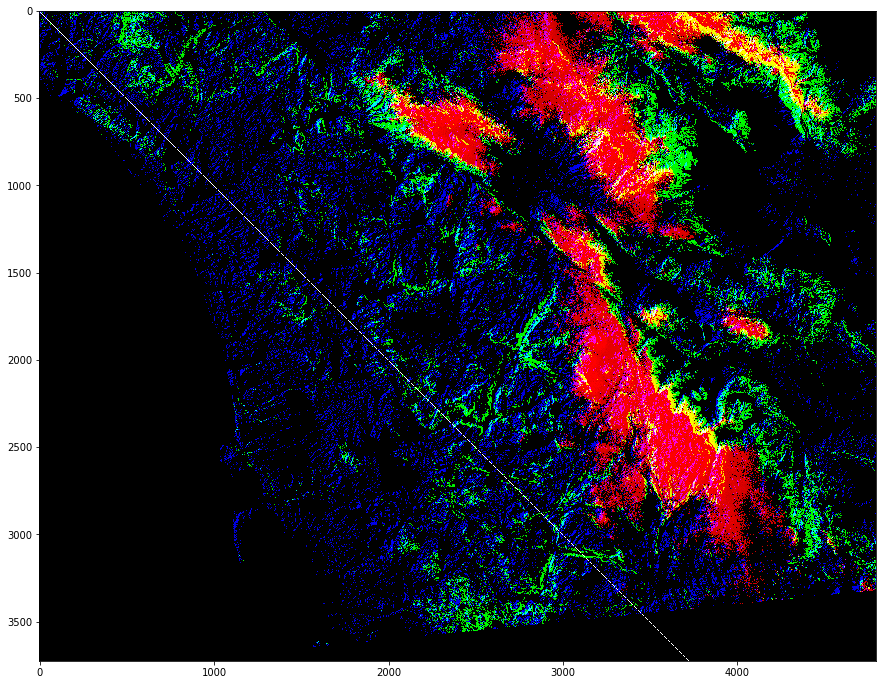

In [37]:
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

In [62]:
a = np.array([2, 3])
b1 = np.array([1])
b2 = 1 
a+b2

array([3, 4])

#### Now we'll do something more interesting. Let's try to cut out the circle.
## MASKING IMAGES
Now let us try try something even cooler...a mask that is in shape of a circular disc

<img src ="./downloaded/1494532821.png">

In [66]:
#these three are elements in photo_data
total_rows, total_cols, total_layers = photo_data.shape
print("photo_data =", photo_data.shape)

photo_data = (3725, 4797, 3)


In [67]:
#ogrid function help us vectorize the distance from centre
#ogrid returns mash grid and return ndarray
X,Y = np.ogrid[:total_rows,:total_cols]
print("X=",X.shape, "and Y =", Y.shape)

X= (3725, 1) and Y = (1, 4797)


In [69]:
#defining centre coordinates
centre_row, centre_col = total_rows/2, total_cols/2

In [70]:
print(centre_row)

1862.5


In [71]:
print(centre_col)

2398.5


In [72]:
dist_from_centre = (X-centre_row)**2 + (Y-centre_col)**2

In [73]:
print(dist_from_centre)

[[9221708.5 9216912.5 9212118.5 ... 9207326.5 9212118.5 9216912.5]
 [9217984.5 9213188.5 9208394.5 ... 9203602.5 9208394.5 9213188.5]
 [9214262.5 9209466.5 9204672.5 ... 9199880.5 9204672.5 9209466.5]
 ...
 [9210542.5 9205746.5 9200952.5 ... 9196160.5 9200952.5 9205746.5]
 [9214262.5 9209466.5 9204672.5 ... 9199880.5 9204672.5 9209466.5]
 [9217984.5 9213188.5 9208394.5 ... 9203602.5 9208394.5 9213188.5]]


In [75]:
radius = (total_rows/2)**2
print("Radius is", radius)
circular_mask = (dist_from_centre > radius)
print(circular_mask)

Radius is 3468906.25
[[ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 ...
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]]


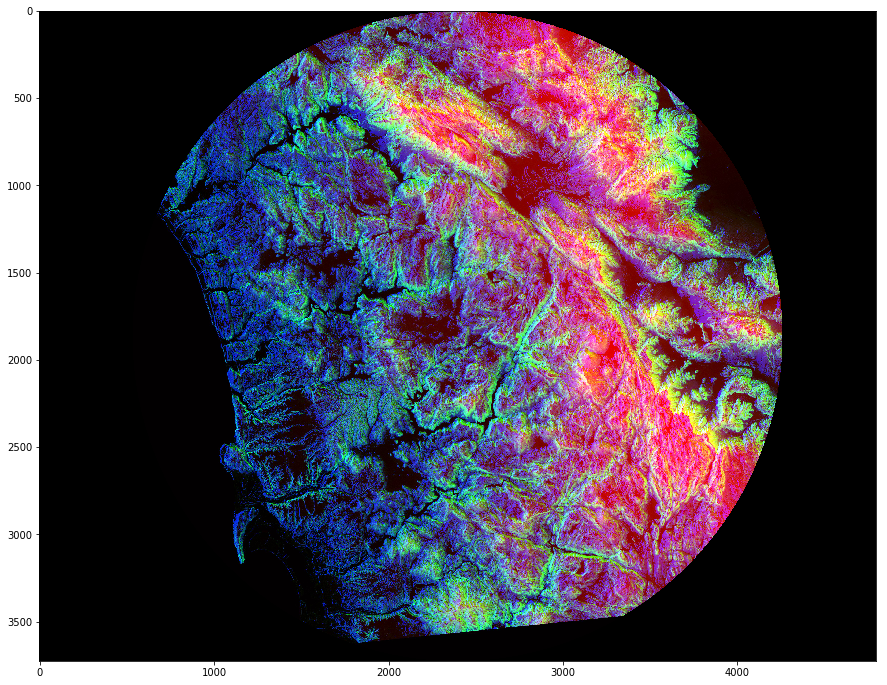

In [78]:
photo_data = imageio.imread('./downloaded/wifire/sd-3layers.jpg')
photo_data[circular_mask] = 0
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

## Further Masking

You can further improve the mask, for example just get upper half disc.

In [79]:
X, Y = np.ogrid[:total_rows,:total_cols]
half_upper = X < centre_row #this line generates a mask for all rows above centre point

#logical function from numoy to combine these two filters
half_upper_circular_mask = np.logical_and(half_upper, circular_mask)


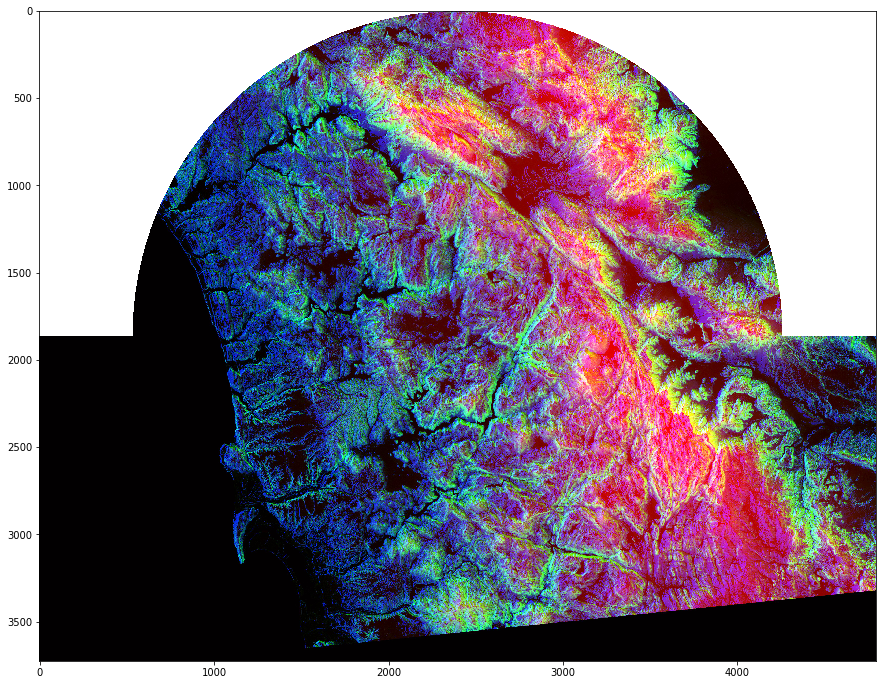

In [81]:
photo_data = imageio.imread('./downloaded/wifire/sd-3layers.jpg')
photo_data[half_upper_circular_mask] = 255
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

## Further Processing of our Satellite Imagery

<font color=red>Processing of RED Pixels</font>
Remember that red pixels tell us about the height. Let us try to highlight all the high altitude areas. We will do this by detecting high intensity RED Pixels and muting down other areas.

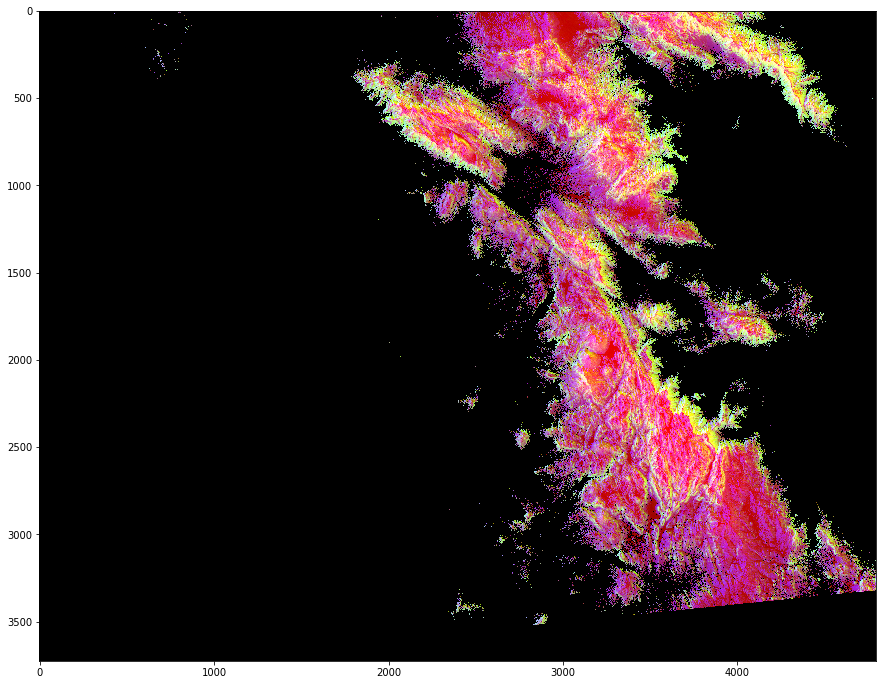

In [83]:
photo_data = imageio.imread('./downloaded/wifire/sd-3layers.jpg')
red_mask = photo_data[:,:,0] < 150 #index 0 is red

photo_data[red_mask] = 0
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

## Detecting Green
<font color=green>Highly Green Pixels</font>

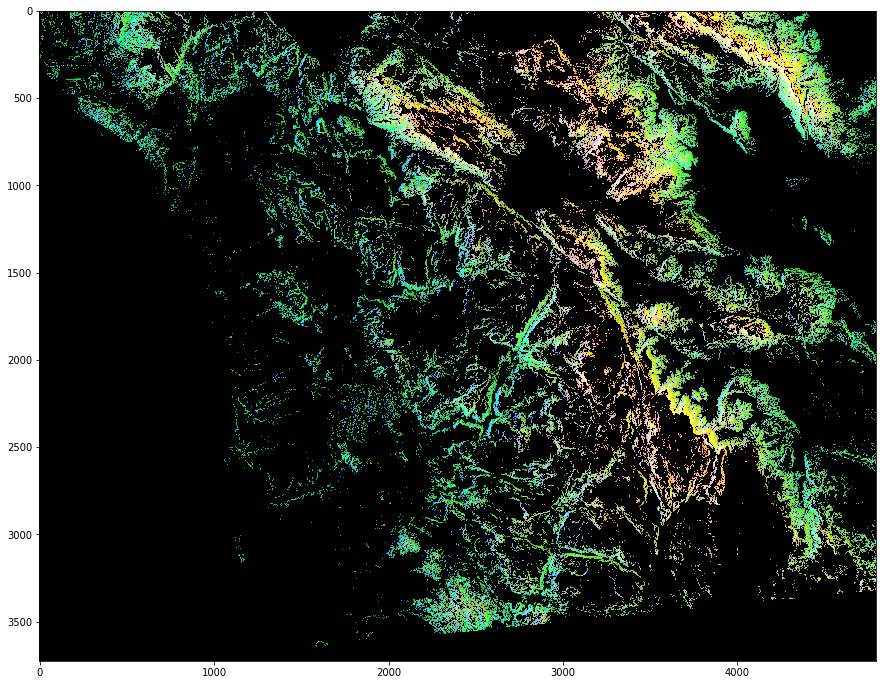

In [84]:
photo_data = imageio.imread('./downloaded/wifire/sd-3layers.jpg')
red_mask = photo_data[:,:,1] < 150  #index 1 is green

photo_data[red_mask] = 0
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

## Detecting Blue
<font color=blue>Highly Blue Pixels</font>

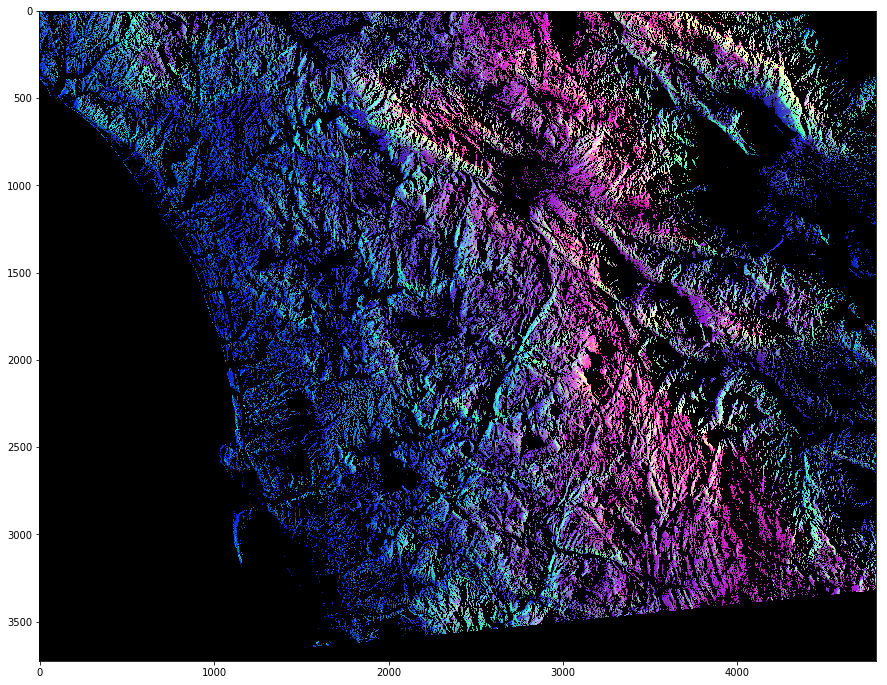

In [85]:
photo_data = imageio.imread('./downloaded/wifire/sd-3layers.jpg')
red_mask = photo_data[:,:,2] < 150  #index 2 is blue

photo_data[red_mask] = 0
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

## Composite mask that takes thresholds on all three layers: RED, GREEN, BLUE

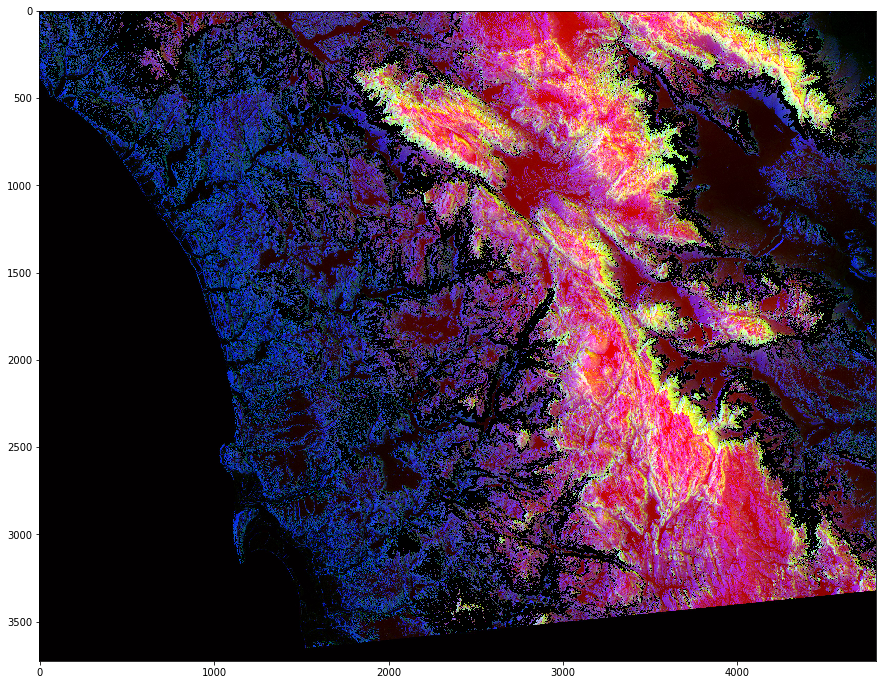

In [86]:
photo_data = imageio.imread('./downloaded/wifire/sd-3layers.jpg')

red_mask = photo_data[:,:,0] <150
green_mask = photo_data[:,:,1] >100
blue_mask = photo_data[:,:,2] <100

final_mask = np.logical_and(red_mask, green_mask, blue_mask)
photo_data[final_mask] = 0
plt.figure(figsize=(15,15))
plt.imshow(photo_data)